# Project 3: Simulating Quantum Systems

In [1]:
using DifferentialEquations, Latexify, Plots, Statistics, LaTeXStrings, LinearAlgebra

Defining the common parameters for the two problems that we are going to tackle:

In [2]:
# Common Parameters

m = 2 # Mass
omega_0 = 1.5 # Frequency of the Classical Oscillator
x_0 = 0 # Initial position
p_0 = 1 # Initial momentum
a_0 = sqrt(0.5*m*omega_0)*(x_0 + 1im*p_0/(m*omega_0)) # A complex number that is a linear combination of x_0 and p_0
time_initial = 0 # Initial time
time_final = 100 # Final time
N_t = 1000 # Number of time steps in between initial and final time
time_span = collect(LinRange(time_initial,time_final,N_t));

## Single Spin System

Here, the aim is to solve for the wavefunction $\psi$, that is subject to the following Hamiltonian:
$$ \hat{H} = \frac{p^2}{2m} + \frac{1}{2}m\omega_0^2x^2 + \frac{\omega_s}{2}\hat{\sigma}_z + \lambda(a^*\hat{\sigma}_- + a\hat{\sigma}_+) $$
where, $a(t)$ (a complex number) is defined as: $$ a(t) = \sqrt{\frac{m\omega_0}{2}}\bigg(x(t)+\iota \frac{p(t)}{m\omega_0}\bigg) $$ which leads us to:
$$ \hat{H} = \omega_0 aa^* + \underbrace{\frac{\omega_s}{2}\hat{\sigma}_z + \lambda(a^*\hat{\sigma}_- + a\hat{\sigma}_+)}_{\hat{h}} $$ 
and it can be easily verified that $\{a,a^*\} = -\iota$

The wavefunction $\psi$ is given as: $$ |\psi\rangle (t) = c_1(t)|\uparrow~\rangle + c_2(t)|\downarrow~\rangle = \begin{pmatrix} c_1(t) \\ c_2(t) \end{pmatrix} $$
Thus, the wavefunction will evolve according to the $\textnormal{Schr\"{o}dinger's}$ equation for the $\hat{h}$ operator, thereby giving us two differential equations. We will also make use of the canonical classical relation that states that the rate of change of an observable is equal to the poisson bracket of the observable and the Hamiltonian of the system!

In [3]:
# Parameters specific to this problem

omega_s = 2.5
lambda = 0.1

c1_0 = 1
c2_0 = 0

u0_ss = [c1_0, c2_0, a_0]; # Initial conditions for the problem

Here, we define the differential equations:
$$ \iota |\dot{\psi}\rangle = \iota \begin{pmatrix} \dot{c_1}(t) \\ \dot{c_2}(t) \end{pmatrix} = \hat{h} \begin{pmatrix} c_1(t) \\ c_2(t) \end{pmatrix} = \hat{h}|\psi\rangle $$
and $\dot{a} = \{a,H_{eff}\}$, where $H_{eff}$ is given by: $$ H_{eff} = \omega_0 aa^* + \frac{\omega_s}{2}\langle\psi|\hat{\sigma}_z|\psi\rangle + \lambda(a^*\langle\psi|\hat{\sigma}_-|\psi\rangle + a\langle\psi|\hat{\sigma}_+|\psi\rangle) $$

One can easily perform the required algebra to arrive at the following three differential equations:
$$ \iota \begin{pmatrix} \dot{c_1} \\ \dot{c_2} \end{pmatrix} = \begin{pmatrix} \frac{\omega_s}{2}c_1+2a\lambda c_2 \\ -\frac{\omega_s}{2}c_2+2a^*\lambda c_1 \end{pmatrix} \\ \dot{a} = -\iota (\omega_0 a + 2 \lambda c^*_1c_2)$$

In [4]:
function singlespin(du,u,p,t) # Define the system

    du[1] = -1im*(0.5*omega_s*u[1] + 2*lambda*u[2]*u[3])
    du[2] = -1im*(-0.5*omega_s*u[2] + 2*lambda*u[1]*conj(u[3]))
    du[3] = -1im*(omega_0*u[3] + 2*lambda*conj(u[1])*u[2])

end

prob_ss = ODEProblem(singlespin, u0_ss ,(time_initial, time_final)); # Construct the ODE problem
sol_ss = solve(prob_ss); # Numerical solution

Now that the problem has been solved, we can easily find the numerical values for all time steps defined in the 'time_span' variable. The first row gives us the values for $c_1(t)$, the middle one for $c_2(t)$ and the last one for $a(t)$ 

In [5]:
solution_ss = reduce(hcat,sol_ss.(time_span)) # Solution for all the points defined under time_span

3×1000 Matrix{ComplexF64}:
 1.0+0.0im          0.992149-0.124796im     …   0.997955+0.0107248im
 0.0+0.0im       -0.00814716-0.000612692im     -0.057667+0.024609im
 0.0+0.408248im    0.0610617+0.403736im        -0.290474+0.280519im

In [6]:
c1_t = solution_ss[1,:]
c2_t = solution_ss[2,:]
a_ss_t = solution_ss[3,:];

We can easily perform the normalization check:

In [7]:
# Checking Normalization
abs2.(c1_t) .+ abs2.(c2_t)

1000-element Vector{Float64}:
 1.0
 1.0000000000000013
 1.0000000000009737
 1.0000000000028464
 0.9999999999996027
 0.9999999999928352
 1.0000000000113611
 1.000000000219066
 1.00000000000394
 0.9999999998731665
 0.9999999995024657
 0.999999999098463
 0.9999999992342236
 ⋮
 0.9999603635111679
 0.9999603364239379
 0.999960293906578
 0.9999603135105648
 0.9999602824238325
 0.9999600628640535
 0.9999599611324684
 0.9999599611516511
 0.9999599612101349
 0.9999599611024811
 0.999959961082608
 0.9999599608875888

It is clear that the states are normalized!

Now, we can easily extract $x(t)$ and $p(t)$ from $a(t)$ in the following manner:
$$ x(t) = \frac{a(t)+a^*(t)}{\sqrt{2m\omega_0}} \\ p(t) = -\iota \sqrt{\frac{m\omega_0}{2}}(a(t)-a^*(t)) $$ 

In [8]:
function position_momentum_values(a_t) # Function to find the position and momentum values
    x_t = real.(1/sqrt(2*m*omega_0)*(a_t .+ conj.(a_t)))
    p_t = real.(-1im*sqrt(0.5*m*omega_0)*(a_t .- conj.(a_t)))

    return x_t, p_t
end

position_momentum_values (generic function with 1 method)

In [9]:
x_ss_t, p_ss_t = position_momentum_values(a_ss_t) 

([0.0, 0.04985664996994216, 0.09855854403392611, 0.14497898462099387, 0.18804662873821146, 0.22677128542494593, 0.2602675275545132, 0.2877755018762408, 0.30867841073155244, 0.32251626167132036  …  -0.27501534665421357, -0.29964779458967267, -0.3174181160247356, -0.3279158428981248, -0.33090288299080794, -0.3263179890924188, -0.3142781702381517, -0.2950753519831553, -0.2691683662797011, -0.23717094034565345], [0.9999999999999998, 0.9889476123757138, 0.9560267896471152, 0.9019420105477873, 0.8278523208063937, 0.7353488936711529, 0.6264239985945612, 0.5034317726228296, 0.369041347239836, 0.22618294182682175  …  -0.5548621243575304, -0.4250714240388645, -0.2858873453188248, -0.14034846580193683, 0.008369529559810454, 0.1570173814119247, 0.30233973942742753, 0.44114316509667245, 0.5703630255609865, 0.6871287735882904])

Different functions have been defined to visualize and animate the Phase plot for the problem in the next code cell.

In [10]:
function Phase_Scatter_Plot(x,p,system::String)
    gr()
    scatter(x,p,xlabel=L"x~→", ylabel=L"p~→", title="Phase Plot for $system System", gridlinewidth=2, legend=false)
end

function Phase_Plot(x,p,system::String)
    gr()
    plot(x,p,xlabel=L"x~→", ylabel=L"p~→", title="Phase Plot for $system System", gridlinewidth=2, legend=false)    
end

function Phase_Plot_Animation(x,p,t,system::String,n_frames=50)
    gr()
    tvals = round.(t, digits=3)
    n_iter = length(x)
    x_lim = maximum(x) + mean(x)
    p_lim = maximum(p) + mean(p)
    anim = @animate for i ∈ 1:n_iter
        curr_t = tvals[i]
        plot((x[1:i], p[1:i]), xlims=(-x_lim,x_lim), ylims=(-p_lim,p_lim), xlabel = L"x(t)~→", ylabel = L"p(t)~→", title = "Phase Plot for $system System" , label="t = $curr_t", gridlinewidth=2)
    end
    gif(anim, "Phase Plot for $system System.gif", fps = n_frames)
end

Phase_Plot_Animation (generic function with 2 methods)

As we expected from classical physics, the phase plot has turned out to be an Ellipse!

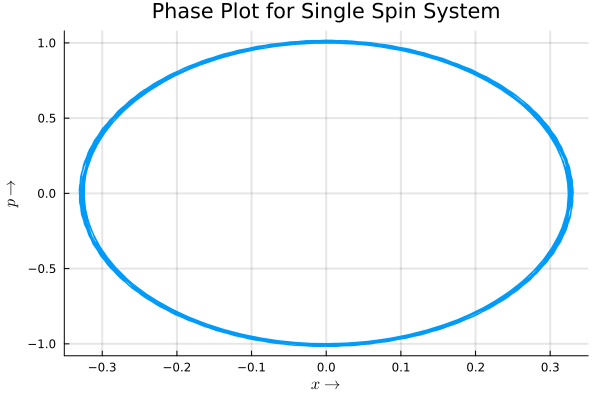

In [11]:
Phase_Plot(x_ss_t,p_ss_t,"Single Spin")

Animating the phase plot:

[ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Phase Plot for Single Spin System.gif


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Phase Plot for Single Spin System.gif")
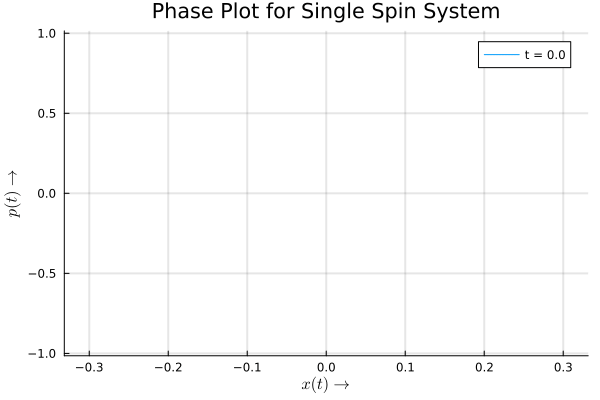

In [12]:
Phase_Plot_Animation(x_ss_t,p_ss_t,time_span,"Single Spin",10)

Scatter plot for better visualization:

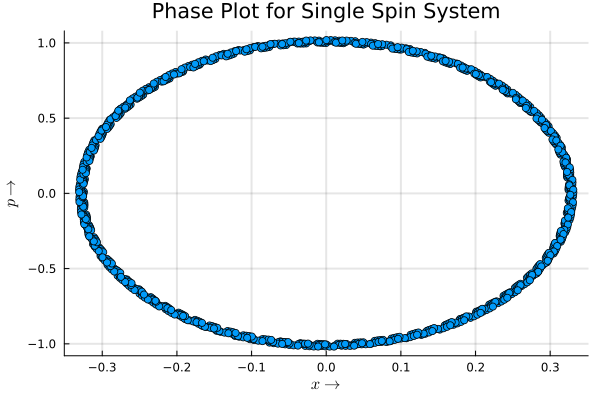

In [13]:
Phase_Scatter_Plot(x_ss_t, p_ss_t,"Single Spin")

Just for fun, we can also find the approximate area of the ellipse as follows:

In [14]:
semi_major_ss = 0.5*(abs(maximum(x_ss_t))+abs(minimum(x_ss_t)))
semi_minor_ss = 0.5*(abs(maximum(p_ss_t))+abs(minimum(p_ss_t)))
area_ss = pi*semi_major_ss*semi_minor_ss
println("Area of Phase Plot for Single Spin system = $area_ss")

Area of Phase Plot for Single Spin system = 1.059353496632607


Now, we analyze the time dependence of expectation values of the three Pauli matrices as follows:
$$ \begin{aligned} \langle\psi|\hat{\sigma}_x|\psi\rangle(t) &= \begin{pmatrix} c^*_1(t) & c^*_2(t) \end{pmatrix} \begin{pmatrix} 0 & 1 \\ 1 & 0 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \end{pmatrix} = 2 \Re(c^*_1(t)c_2(t)) \\ \langle\psi|\hat{\sigma}_y|\psi\rangle(t) &= \begin{pmatrix} c^*_1(t) & c^*_2(t) \end{pmatrix} \begin{pmatrix} 0 & -\iota \\ \iota & 0 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \end{pmatrix} = 2 \Im(c^*_1(t)c_2(t)) \\ \langle\psi|\hat{\sigma}_z|\psi\rangle(t) &= \begin{pmatrix} c^*_1(t) & c^*_2(t) \end{pmatrix} \begin{pmatrix} 1 & 0 \\ 0 & -1 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \end{pmatrix} = |c_1(t)|^2 - |c_2(t)|^2 \end{aligned} $$

In [15]:
sigmax_exp_val_ss = 2*real.(conj.(c1_t) .* c2_t)
sigmay_exp_val_ss = 2*imag.(conj.(c1_t) .* c2_t)
sigmaz_exp_val_ss = abs2.(c1_t) .- abs2.(c2_t);

In [16]:
function plot_expectation_values(expval, timevals, axis::String) # For plotting the expectation values at different times
    gr()
    plot(timevals, expval, label=latexstring("⟨σ_","{$axis}","⟩(t)"), xlabel=L"t~→", ylabel=latexstring("⟨σ_","{$axis}","⟩(t)~→"), title=string(latexstring("⟨σ_","{$axis}⟩")," as a function of time"), gridlinewidth=2) 
end

plot_expectation_values (generic function with 1 method)

Plotting the variation of different expectation values with time.

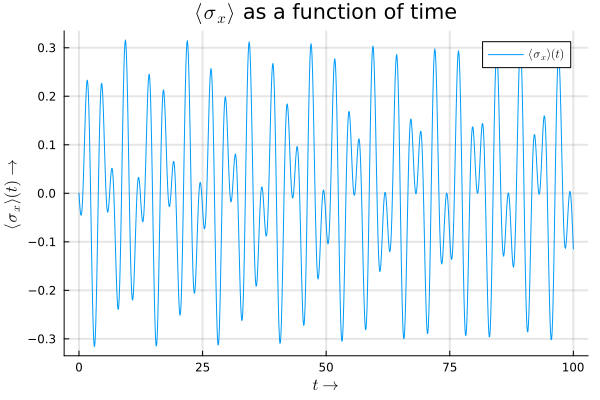

In [17]:
plot_expectation_values(sigmax_exp_val_ss,time_span,"x")

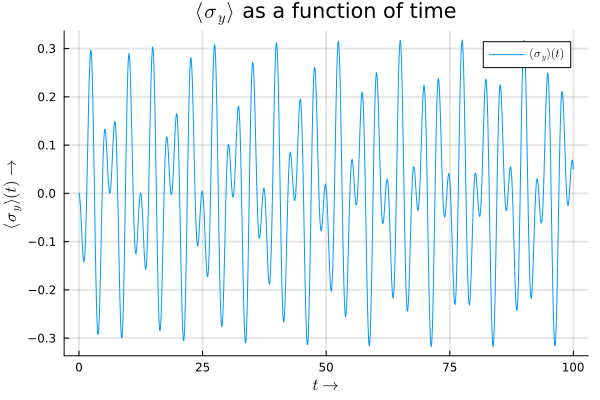

In [18]:
plot_expectation_values(sigmay_exp_val_ss,time_span,"y")

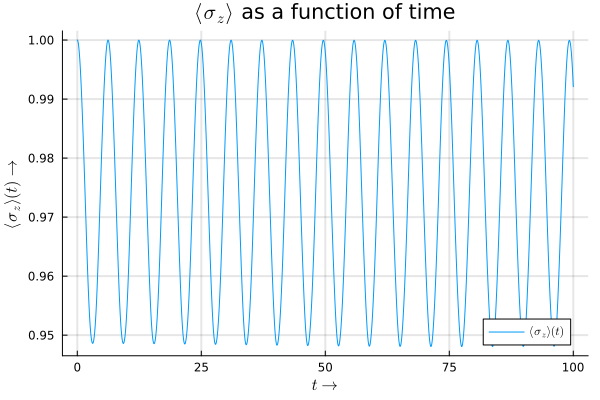

In [19]:
plot_expectation_values(sigmaz_exp_val_ss,time_span,"z")

Plotting the variation of total expectation "vector", i.e., $\vec{\langle \hat{\sigma} \rangle}(t) = \langle \hat{\sigma}_x \rangle(t) \hat{i} + \langle \hat{\sigma}_y \rangle(t) \hat{j} + \langle \hat{\sigma}_z \rangle(t) \hat{k}  $ with time:

[ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Varying Expectations (Single Spin).gif


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Varying Expectations (Single Spin).gif")
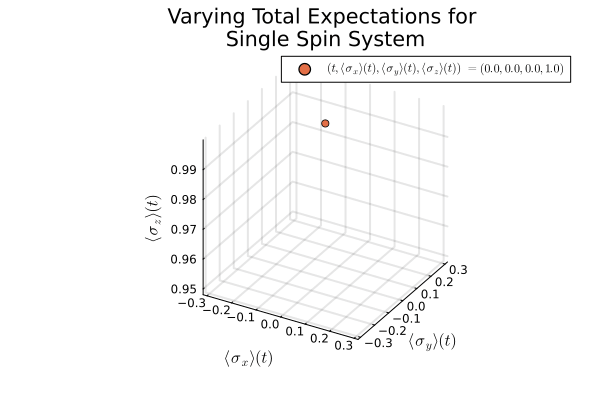

In [27]:
gr()
anim_new = @animate for i ∈ 1:N_t
    curr_t,x,y,z = round.((time_span[i],sigmax_exp_val_ss[i],sigmay_exp_val_ss[i],sigmaz_exp_val_ss[i]),digits=2)
    plot(sigmax_exp_val_ss[1:i], sigmay_exp_val_ss[1:i], sigmaz_exp_val_ss[1:i], zlims=(minimum(sigmaz_exp_val_ss),maximum(sigmaz_exp_val_ss)), ylims=(minimum(sigmay_exp_val_ss),maximum(sigmay_exp_val_ss)), xlims=(minimum(sigmax_exp_val_ss),maximum(sigmax_exp_val_ss)), label="", title="Varying Total Expectations for \nSingle Spin System", gridlinewidth=2);
    scatter!((sigmax_exp_val_ss[i], sigmay_exp_val_ss[i], sigmaz_exp_val_ss[i]), label=L"(t,\langle \sigma_{x}\rangle (t),\langle \sigma_{y}\rangle (t),\langle \sigma_{z}\rangle (t))~="*latexstring("($curr_t,$x,$y,$z)"), xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)", legend=:topright);
end
gif(anim_new, string("Varying Expectations (Single Spin).gif"), fps = 20)

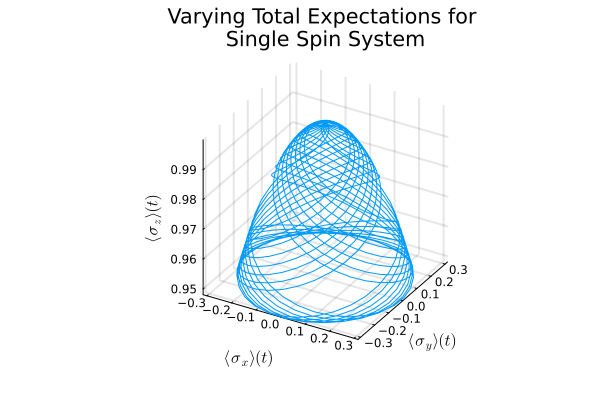

In [21]:
plot(sigmax_exp_val_ss, sigmay_exp_val_ss, sigmaz_exp_val_ss, zlims=(minimum(sigmaz_exp_val_ss),maximum(sigmaz_exp_val_ss)), ylims=(minimum(sigmay_exp_val_ss),maximum(sigmay_exp_val_ss)), xlims=(minimum(sigmax_exp_val_ss),maximum(sigmax_exp_val_ss)), label="", title="Varying Total Expectations for \nSingle Spin System", xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)" ,gridlinewidth=2)

Scatter plot for the same:

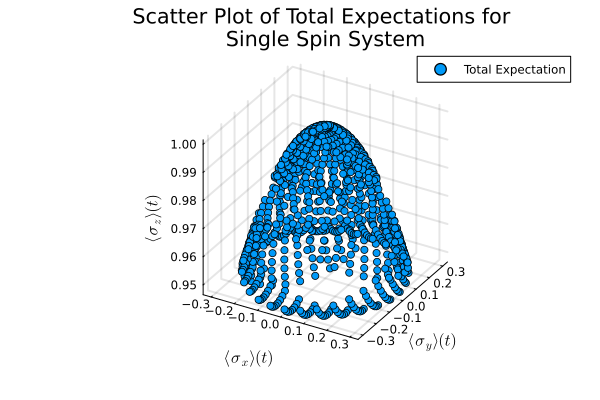

In [22]:
scatter(sigmax_exp_val_ss,sigmay_exp_val_ss,sigmaz_exp_val_ss, label="Total Expectation", title="Scatter Plot of Total Expectations for \nSingle Spin System", xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)", gridlinewidth=2)

Now, we try to visualize the evolution of the spin state on the Bloch sphere.

For this, we make use of the fact that $c_1(t) = |c_1(t)|\exp{\iota \theta_1}$ and $c_2(t) = |c_2(t)|\exp{\iota \theta_2}$, such that $|c_1(t)|^2 + |c_2(t)|^2 = 1$ for all times. Using the standard representation for states on the Bloch sphere, we can easily identify and find the requried polar coordinates as:
$$ \begin{aligned} \theta &= 2\cos^{-1}|c_1(t)| \\ \phi &= \theta_2 - \theta_1 \end{aligned} $$ 
These values can then be used to find the points on the Bloch sphere $(x,y,z) = (\sin{\theta}\cos{\phi},\sin{\theta}\sin{\phi},\cos{\theta})$

In [23]:
theta_test = 2*acos.(abs.(c1_t));
angle_phi = angle.(c2_t) .- angle.(c1_t)

x_r = cos.(angle_phi) .* sin.(theta_test)
y_r = sin.(angle_phi) .* sin.(theta_test)
z_r = cos.(theta_test);

Now we define a function to animate the motion of the spin state on the Bloch sphere. It plots the final state at the final time as well as shows the evolution of the state from initial to the final instant of time.

In [24]:
function bloch_sphere_rep(x_r, y_r, z_r,t,n_frames=5)
    n_iter = length(x_r)
    X(r,theta,phi) = r * sin(theta) * sin(phi)
    Y(r,theta,phi) = r * sin(theta) * cos(phi)
    Z(r,theta,phi) = r * cos(theta)

    thetas = range(0, stop=pi,   length=50)
    phis   = range(0, stop=2pi, length=50)

    xs = [X(1, theta, phi) for theta in thetas, phi in phis] 
    ys = [Y(1, theta, phi) for theta in thetas, phi in phis]
    zs = [Z(1, theta, phi) for theta in thetas, phi in phis]
    pyplot()
    anim = @animate for i ∈ 1:n_iter
        curr_t,x,y,z = round.((t[i],x_r[i],y_r[i],z_r[i]),digits=2)
        surface(xs, ys, zs, lims=(-1,1), color=:tofino, colorbar=:false, alpha = 0.2);
        plot!(([0,x_r[i]], [0,y_r[i]], [0,z_r[i]]), lims=(-1,1), label="State Vector");
        scatter!((x_r[i], y_r[i], z_r[i]), label=latexstring("(t,x,y,z)~=","($curr_t,$x,$y,$z)"), xlabel="x", ylabel="y", zlabel="z", title="Bloch Sphere Representation");
        #path3d!(x_r[1:i],y_r[1:i],z_r[1:i], alpha=0.5, label="Path");
    end
    gif(anim, string("Bloch Sphere (",n_iter," iterations).gif"), fps = n_frames)
end

bloch_sphere_rep (generic function with 2 methods)

sys:1: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
[ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Bloch Sphere (1000 iterations).gif


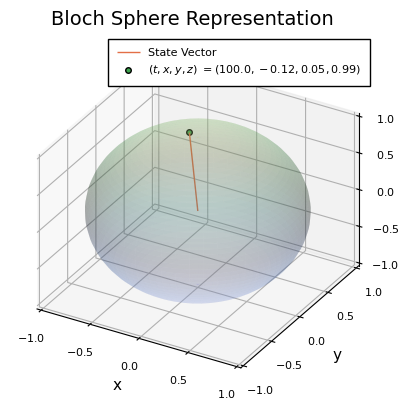

Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Bloch Sphere (1000 iterations).gif")
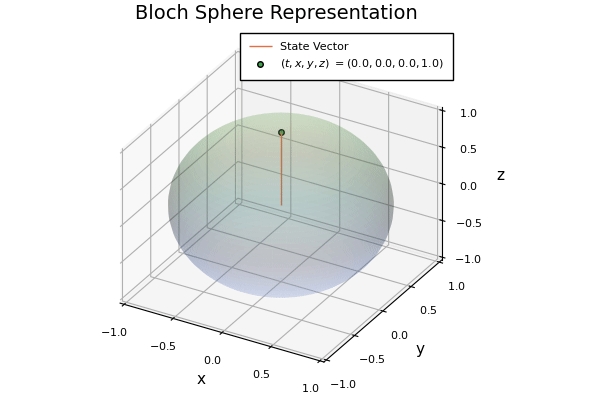

In [26]:
bloch_sphere_rep(x_r,y_r,z_r,time_span)

### Entropy
The Von Neumann Entropy ($S$) for a physical quantum system represented by state $|\psi\rangle$ is given by:
$$ S = -tr(\rho\ln{\rho}) = -\sum_i \lambda_i \ln{\lambda_i} $$
where $\rho = |\psi\rangle\langle\psi|$ is called the Density Matrix and $\lambda_i$'s are the eigenvalues of the Density Matrix

We use the first definition involving trace to find the entropy in the following function:

In [28]:
function entropy_ss(c::Matrix) # To calculate entropy
    n_vars, n_timesteps = size(c)
    entropy_vals = zeros(n_timesteps)
    for i in 1:n_timesteps
        red_den_mat = c[:,i] .* transpose(conj.(c[:,i]))
        entropy_vals[i] = real(-tr(red_den_mat * log(red_den_mat)))
    end
    return entropy_vals
end

entropy_ss (generic function with 1 method)

In [29]:
entropy_vals_ss = entropy_ss(solution_ss[1:2,:]); # Entropy values

In [30]:
function plot_entropy(entropy_vals, timevals) # For plotting the variation of entropy with time
    gr()
    idx_vec = .!isnan.(entropy_vals)
    new_entr_vals = entropy_vals[idx_vec]
    new_time = timevals[idx_vec]
    plot(new_time, new_entr_vals, xlabel=L"t~→", ylabel=L"S(t)~→", label=L"S(t)", title="Variation of Entropy with Time", gridlinewidth=2)
end

plot_entropy (generic function with 1 method)

Now, we plot the variation of entropy with time. It is important to note that some NaN values were encountered during the calculations due to terms like $\ln{0}$ and thus all the NaN values were discarded while plotting. If NaN values were to be included, say by taking them to be 0, there were very sharp downward spikes which needs further physical justification and consideration.

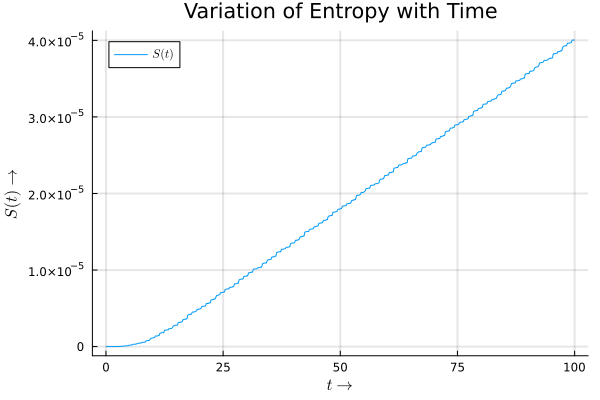

In [31]:
plot_entropy(entropy_vals_ss, time_span)

## Two Spin System

Now, we examine the consequences of including another spin. The new Hamiltonian to be considered is given by:
$$ \hat{H} = \omega_0 aa^* + \underbrace{\frac{\omega_s^{(1)}}{2}\hat{\sigma}^{(1)}_z + \lambda_1(a^*\hat{\sigma}^{(1)}_- + a\hat{\sigma}^{(1)}_+) + \frac{\omega_s^{(2)}}{2}\hat{\sigma}^{(2)}_z + \lambda_2(a^*\hat{\sigma}^{(2)}_- + a\hat{\sigma}^{(2)}_+) + g(\hat{\sigma}^{(1)}_+\hat{\sigma}^{(2)}_- + \hat{\sigma}^{(1)}_-\hat{\sigma}^{(2)}_+)}_{\hat{h}} $$

When we talk about any operator confined to the space of a single part, say $\hat{\sigma}^{(1)}_z$, what we mean is that the corresponding operator for the other space is identity, $\mathcal{1}$, i.e. $$ \hat{\sigma}^{(1)}_z = \hat{\sigma}^{(1)}_z \otimes \mathcal{1}^{(2)} $$

Now, in this case, the wavefunction $\psi$ is given as: $$ |\psi\rangle (t) = c_1(t)|\uparrow\uparrow~\rangle + c_2(t)|\uparrow\downarrow~\rangle + c_3(t)|\downarrow\uparrow~\rangle + c_4(t)|\downarrow\downarrow~\rangle = \begin{pmatrix} c_1(t) \\ c_2(t) \\ c_3(t) \\ c_4(t) \end{pmatrix} $$


In [32]:
# Parameters specific to this problem

omega_1 = 2
omega_2 = 3
lambda_1 = 0.05
lambda_2 = 0.01
g = 0.001
c11 = 1/sqrt(3) # c1
c10 = 1/sqrt(2) # c2
c01 = 1/sqrt(6) # c3
c00 = 0         # c4

0

In [33]:
u0_ts = [c11, c10, c01, c00, a_0]; # Initial conditions

We can again go through the algebra to arrive at the following five differential equations:
$$ \begin{aligned} \iota \begin{pmatrix} \dot{c_1} \\ \dot{c_2} \\ \dot{c_3} \\ \dot{c_4} \end{pmatrix} &= \begin{pmatrix} \frac{\omega_s^{(1)}+\omega_s^{(2)}}{2}c_1+2a\lambda_1 c_3 +2a\lambda_2 c_2 \\ \frac{\omega_s^{(1)}-\omega_s^{(2)}}{2}c_2+2a\lambda_1 c_4 +2a^*\lambda_2 c_1 +4gc_3 \\ \frac{\omega_s^{(2)}-\omega_s^{(1)}}{2}c_3+2a^*\lambda_1 c_1 +2a\lambda_2 c_4 +4gc_2 \\ -\frac{\omega_s^{(1)}+\omega_s^{(2)}}{2}c_4+2a^*\lambda_1 c_2 +2a^*\lambda_2 c_3 \end{pmatrix} \\ \dot{a} &= -\iota (\omega_0 a + 2 \lambda_1 c_1c^*_3 + 2\lambda_1 c_2c^*_4 + 2\lambda_2 c_1c^*_2 +2\lambda_2 c_3 c^*_4) \end{aligned} $$

In [34]:
function doublespin(du,u,p,t) # Defining the problem

    du[1] = -1im*(0.5*(omega_1+omega_2)*u[1] + 2*lambda_1*u[3]*u[5] + 2*lambda_2*u[2]*u[5])
    du[2] = -1im*(0.5*(omega_1-omega_2)*u[2] + 2*lambda_1*u[4]*u[5] + 2*lambda_2*u[1]*conj(u[5]) + 4*g*u[3])
    du[3] = -1im*(0.5*(-omega_1+omega_2)*u[3] + 2*lambda_1*u[1]*conj(u[5]) + 2*lambda_2*u[4]*u[5] + 4*g*u[2])
    du[4] = -1im*(-0.5*(omega_1+omega_2)*u[4] + 2*lambda_1*u[2]*conj(u[5]) + 2*lambda_2*u[3]*conj(u[5]))
    du[5] = -1im*(omega_0*u[5] + 2*lambda_1*(u[1]*conj(u[3])+u[2]*conj(u[4])) + 2*lambda_2*(u[1]*conj(u[2])+u[3]*conj(u[4])))

end

prob_ts = ODEProblem(doublespin, u0_ts ,(time_initial, time_final)) # Construct the ODE Problem
sol_ts = solve(prob_ts); # Solve the system

In [35]:
solution_ts = reduce(hcat,sol_ts.(time_span)); # Extend the solution to all the time steps

In [36]:
c11_t = solution_ts[1,:] # c_1
c10_t = solution_ts[2,:] # c_2
c01_t = solution_ts[3,:] # c_3
c00_t = solution_ts[4,:] # c_4
a_ts_t = solution_ts[5,:];

We again perform a normalization check and find that the state at all times is normalized:

In [37]:
# Checking Normalization
abs2.(c11_t) .+ abs2.(c10_t) .+ abs2.(c01_t) .+ abs2.(c00_t)

1000-element Vector{Float64}:
 1.0
 1.0000000000024534
 0.9999999999998589
 0.9999999999796116
 1.0000000011150703
 0.9999999998971643
 0.9999999987438034
 0.9999999983705353
 1.0000000033797003
 0.999999995959988
 0.9999999921714329
 0.9999999832336411
 0.9999999947560089
 ⋮
 0.9996850890248685
 0.999685321416592
 0.9996845359901805
 0.9996846920527838
 0.9996832057751233
 0.9996821875447791
 0.9996826685828792
 0.9996830539146276
 0.9996825151835389
 0.9996822170010251
 0.9996817888611343
 0.9996797815012034

Again finding $x(t)$ and $p(t)$ for the two spin system:

In [38]:
x_ts_t, p_ts_t = position_momentum_values(a_ts_t)

([0.0, 0.04938017725772622, 0.09671887914609435, 0.1410388657319684, 0.1814756499501168, 0.21728838812956486, 0.24786576709061978, 0.2727275278863061, 0.29152245960214224, 0.3040238143913734  …  -0.3339481598761937, -0.30316742234227145, -0.2645717051964113, -0.21902292069702575, -0.1675900031284627, -0.11152506939668175, -0.052232483146724316, 0.008769372972157878, 0.06989106737812936, 0.12951930073152151], [0.9999999999999998, 0.9811412111550117, 0.940927012601334, 0.8808708821464667, 0.8028485801095409, 0.7090259691723972, 0.6017880283837911, 0.4836721128560776, 0.35730770983888843, 0.2253640609363532  …  0.5415763507742416, 0.6935801048071168, 0.8300543344969268, 0.9472752325708066, 1.04194757660571, 1.1113160144051415, 1.153264288632384, 1.1663985960996284, 1.1501066827888737, 1.104593677570709])

Plotting Phase Plots:

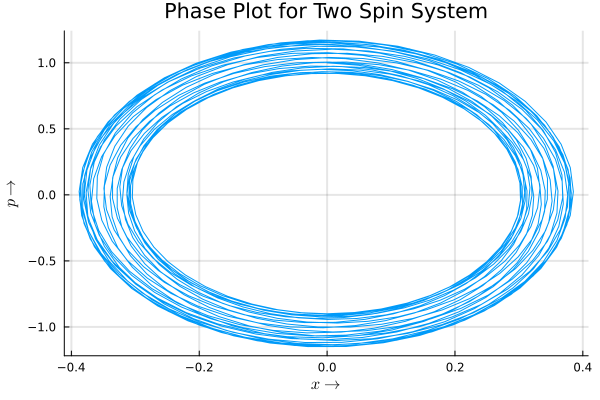

In [39]:
Phase_Plot(x_ts_t,p_ts_t,"Two Spin")

[ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Phase Plot for Two Spin System.gif


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Phase Plot for Two Spin System.gif")
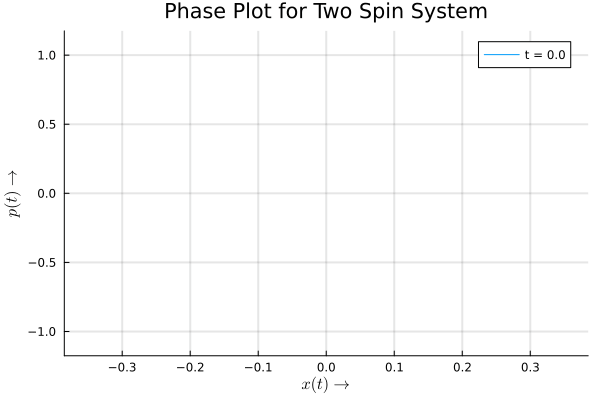

In [40]:
Phase_Plot_Animation(x_ts_t,p_ts_t,time_span, "Two Spin",8)

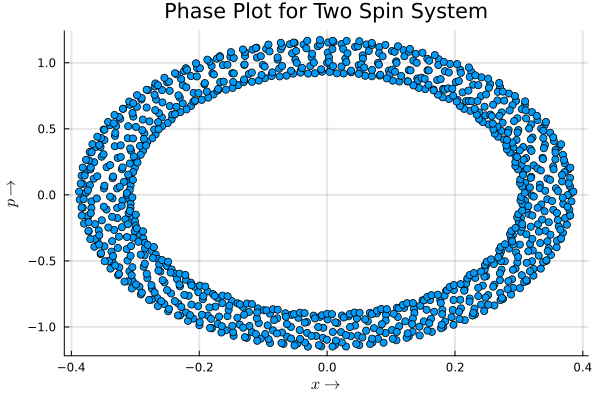

In [41]:
Phase_Scatter_Plot(x_ts_t,p_ts_t, "Two Spin")

Again, for fun, calculating the area:

In [42]:
semi_major_ts = 0.5*(abs(maximum(x_ts_t))+abs(minimum(x_ts_t)))
semi_minor_ts = 0.5*(abs(maximum(p_ts_t))+abs(minimum(p_ts_t)))
area_ts = pi*semi_major_ts*semi_minor_ts
println("Area of Phase Plot for Two Spin system = $area_ts")

Area of Phase Plot for Two Spin system = 1.4091987631962521


We can again analyze the time dependence of total expectation values for the three Pauli matrices as:
$$ \langle\hat{\sigma}^{tot}_i\rangle = \langle\hat{\sigma}^{(1)}_i\rangle + \langle\hat{\sigma}^{(2)}_i\rangle \equiv \langle\hat{\sigma}^{(1)}_i \otimes \mathcal{1}^{(2)}\rangle + \langle \mathcal{1}^{(1)} \otimes \hat{\sigma}^{(2)}_i\rangle $$ 
where $i \in \{x,y,z\}$ 

If one works out the algebra, then it can be easily seen that:
$$ \begin{aligned} \langle\psi|\hat{\sigma}^{tot}_x|\psi\rangle(t) &= \begin{pmatrix} c^*_1(t) & c^*_2(t) & c^*_3(t) & c^*_4(t) \end{pmatrix} \begin{pmatrix} 0 & 1 & 1 & 0 \\ 1 & 0 & 0 & 1 \\ 1 & 0 & 0 & 1 \\ 0 & 1 & 1 & 0 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \\ c_3(t) \\ c_4(t) \end{pmatrix} = 2 \Re\{(c^*_1(t)+c^*_4(t))(c_2(t)+c_3(t))\} \\ \langle\psi|\hat{\sigma}^{tot}_y|\psi\rangle(t) &= \begin{pmatrix} c^*_1(t) & c^*_2(t) & c^*_3(t) & c^*_4(t) \end{pmatrix} \begin{pmatrix} 0 & -\iota & -\iota & 0 \\ \iota & 0 & 0 & -\iota \\ \iota & 0 & 0 & -\iota \\ 0 & \iota & \iota & 0 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \\ c_3(t) \\ c_4(t) \end{pmatrix} = 2 \Im\{(c^*_1(t)-c^*_4(t))(c_2(t)+c_3(t))\} \\ \langle\psi|\hat{\sigma}^{tot}_z|\psi\rangle(t) &= \begin{pmatrix} c^*_1(t) & c^*_2(t) & c^*_3(t) & c^*_4(t) \end{pmatrix} \begin{pmatrix} 2 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & 0 \\ 0 & 0 & 0 & -2 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \\ c_3(t) \\ c_4(t) \end{pmatrix} = 2(|c_1(t)|^2 - |c_4(t)|^2) \end{aligned} $$

In [43]:
sigmax_exp_val_ts = 2*real.(conj.(c11_t .+ c00_t) .* (c10_t .+ c01_t))
sigmay_exp_val_ts = 2*imag.(conj.(c11_t .- c00_t) .* (c10_t .+ c01_t))
sigmaz_exp_val_ts = 2*(abs2.(c11_t) .- abs2.(c00_t));

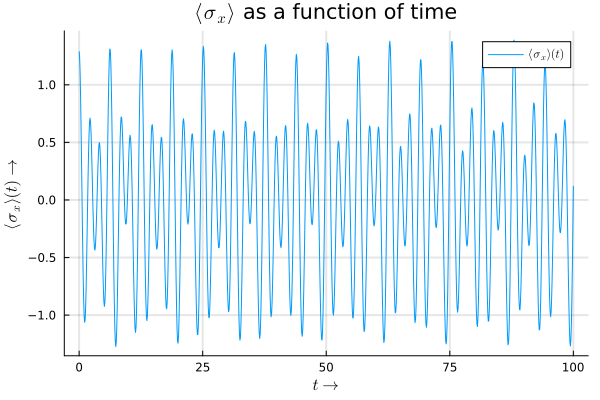

In [44]:
plot_expectation_values(sigmax_exp_val_ts,time_span,"x")

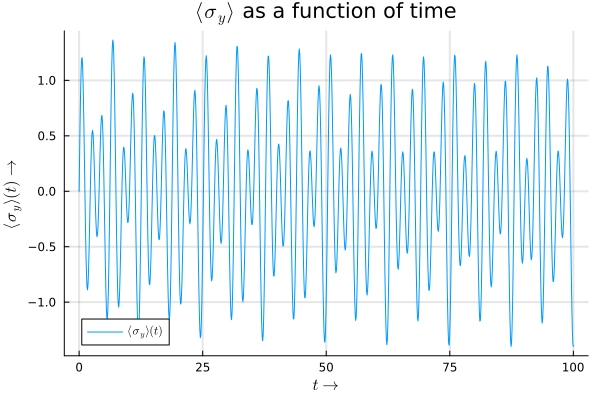

In [45]:
plot_expectation_values(sigmay_exp_val_ts,time_span,"y")

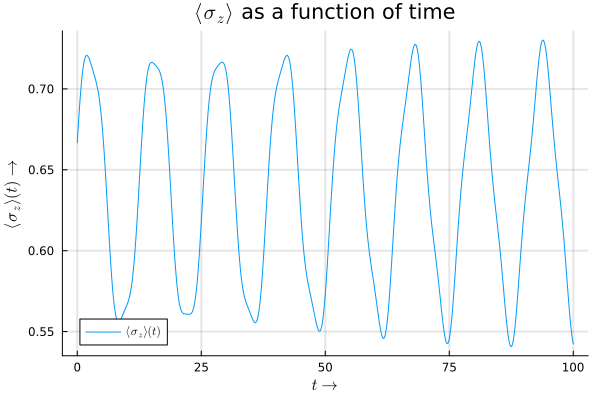

In [46]:
plot_expectation_values(sigmaz_exp_val_ts,time_span,"z")

Plotting the total expectation "vector" as a function of time as done previously:

[ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Varying Expectations (Two Spin).gif


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Varying Expectations (Two Spin).gif")
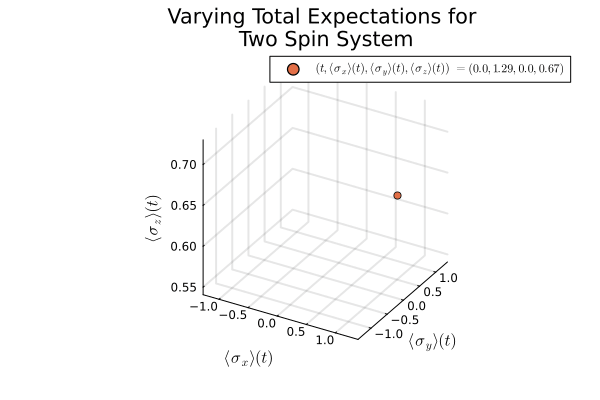

In [47]:
gr()
anim_new = @animate for i ∈ 1:N_t
    curr_t,x,y,z = round.((time_span[i],sigmax_exp_val_ts[i],sigmay_exp_val_ts[i],sigmaz_exp_val_ts[i]),digits=2)
    plot(sigmax_exp_val_ts[1:i], sigmay_exp_val_ts[1:i], sigmaz_exp_val_ts[1:i], zlims=(minimum(sigmaz_exp_val_ts),maximum(sigmaz_exp_val_ts)), ylims=(minimum(sigmay_exp_val_ts),maximum(sigmay_exp_val_ts)), xlims=(minimum(sigmax_exp_val_ts),maximum(sigmax_exp_val_ts)), label="", title="Varying Total Expectations for \nTwo Spin System", gridlinewidth=2);
    scatter!((sigmax_exp_val_ts[i], sigmay_exp_val_ts[i], sigmaz_exp_val_ts[i]), label=L"(t,\langle \sigma_{x}\rangle (t),\langle \sigma_{y}\rangle (t),\langle \sigma_{z}\rangle (t))~="*latexstring("($curr_t,$x,$y,$z)"), xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)", legend=:topright);
end
gif(anim_new, string("Varying Expectations (Two Spin).gif"), fps = 10)

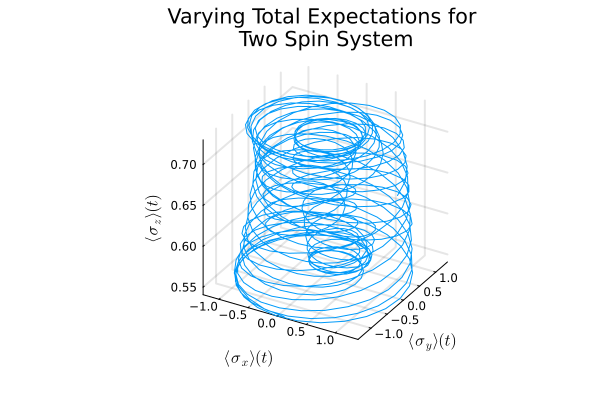

In [48]:
plot(sigmax_exp_val_ts, sigmay_exp_val_ts, sigmaz_exp_val_ts, zlims=(minimum(sigmaz_exp_val_ts),maximum(sigmaz_exp_val_ts)), ylims=(minimum(sigmay_exp_val_ts),maximum(sigmay_exp_val_ts)), xlims=(minimum(sigmax_exp_val_ts),maximum(sigmax_exp_val_ts)), label="", title="Varying Total Expectations for \nTwo Spin System", xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)" ,gridlinewidth=2)

Scatter plot of the same:

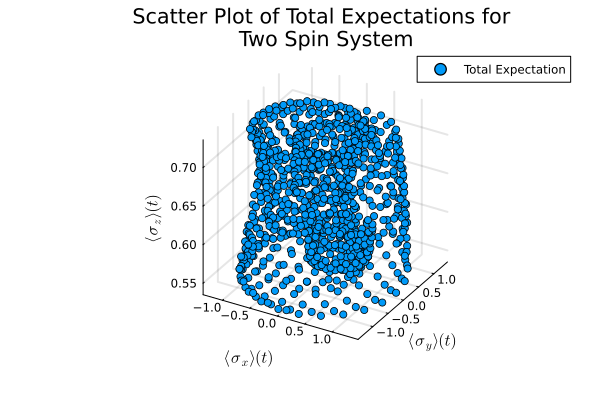

In [49]:
scatter(sigmax_exp_val_ts,sigmay_exp_val_ts,sigmaz_exp_val_ts, label="Total Expectation", title="Scatter Plot of Total Expectations for \nTwo Spin System", xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)", gridlinewidth=2, legend=:topright)

Yet another expectation value that we might be interested in is as follows:
$$ \langle \hat{\sigma}^{(1)}_+ \hat{\sigma}^{(2)}_- + \hat{\sigma}^{(1)}_- \hat{\sigma}^{(2)}_+\rangle_{\psi}(t) = \langle\psi|\hat{\sigma}^{(1)}_+ \otimes \hat{\sigma}^{(2)}_- + \hat{\sigma}^{(1)}_- \otimes \hat{\sigma}^{(2)}_+|\psi\rangle(t) = \begin{pmatrix} c^*_1(t) & c^*_2(t) & c^*_3(t) & c^*_4(t) \end{pmatrix} \begin{pmatrix} 0 & 0 & 0 & 0 \\ 0 & 0 & 4 & 0 \\ 0 & 4 & 0 & 0 \\ 0 & 0 & 0 & 0 \end{pmatrix}  \begin{pmatrix} c_1(t) \\ c_2(t) \\ c_3(t) \\ c_4(t) \end{pmatrix} = 8\Re(c^*_2(t)c_3(t)) $$

Let us denote $\hat{\sigma}_0 = \hat{\sigma}^{(1)}_+ \hat{\sigma}^{(2)}_- + \hat{\sigma}^{(1)}_- \hat{\sigma}^{(2)}_+$

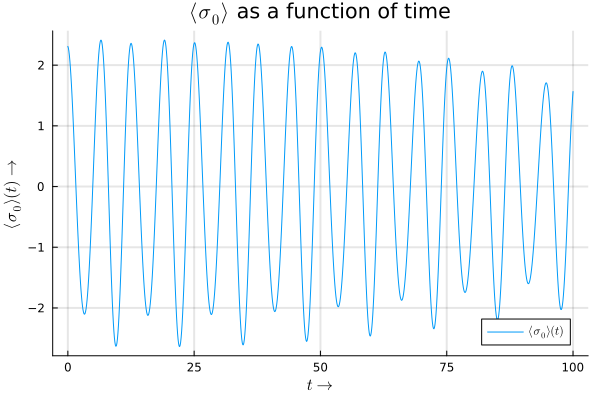

In [50]:
sigma0_exp_val_ts = 8*real.(conj.(c10_t) .* c01_t)
plot_expectation_values(sigma0_exp_val_ts, time_span, "0")

### Entropy

The Von Neumann Entropy of Entanglement can be calculated in exactly the same way as described previously using the reduced Density Matrix, $\rho_{red}$ :
$$ S(\rho_{red}) = -tr(\rho_{red}\ln{\rho_{red}}) = -\sum_i \lambda_i \ln{\lambda_i} $$
where the reduced Density Matrix $(\rho_{red})$ is found by $\underline{\textnormal{partial tracing}}$ the actual Density Matrix $(\rho)$ over one of the spins. For our case, we trace over the second spin:
$$ \rho_{red} = \textnormal{tr}_2{\rho} $$

Going over the algebra, we find that the reduced Density Matrix is of the form:
$$ \rho_{red} = \begin{bmatrix} |c_1(t)|^2 + |c_2(t)|^2 & c_1(t)c^*_3(t)+c_2(t)c^*_4(t) \\ c^*_1(t)c_3(t)+c^*_2(t)c_4(t) & |c_3(t)|^2 + |c_4(t)|^2 \end{bmatrix} $$

The calculation for $\rho_{red}$ was done consulting resources at [Qiskit](https://qiskit.org/textbook/ch-quantum-hardware/density-matrix.html#4.-The-Reduced-Density-Matrix--).

In [51]:
# Function to calculate reduced density matrix
function reduced_density_matrix(c)
    m1 = abs2(c[1]) + abs2(c[2])
    m3 = abs2(c[3]) + abs2(c[4])
    m2 = c[1]*conj(c[3]) + c[2]*conj(c[4])
    red_den_mat = [[m1, conj(m2)] [m2, m3]]

    return red_den_mat
end

reduced_density_matrix (generic function with 1 method)

In [52]:
red_den_mat_ts_ss = [reduced_density_matrix(solution_ts[1:4,i]) for i in 1:N_t]; # Each element of this vector is a 2x2 matrix

Defining Pauli Matrices:

In [53]:
sigmax = [[0, 1] [1, 0]]
sigmay = [[0, 1im] [-1im, 0]]
sigmaz = [[1, 0] [0, -1]];

Now, we can calculate the expectations values for all the three Pauli matrices using the result that for any obervable $A$:
$$ \langle A \rangle = \textnormal{tr}(\rho A) $$
where $\rho$ is the concerned Density Matrix, which in our case is the reduced Density Matrix $(\rho_{red})$!

In [54]:
red_exp_val_sigmax_ts_ss = real.(tr.([sigmax * red_den_mat_ts_ss[i] for i in 1:N_t]))
red_exp_val_sigmay_ts_ss = real.(tr.([sigmay * red_den_mat_ts_ss[i] for i in 1:N_t]))
red_exp_val_sigmaz_ts_ss = real.(tr.([sigmaz * red_den_mat_ts_ss[i] for i in 1:N_t]));

Plotting the variations of expectation values of Pauli matrices with time for the $\underline{\textnormal{reduced single spin}}$ system

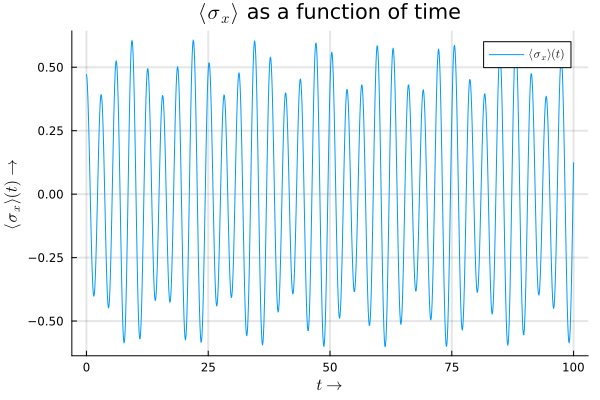

In [56]:
plot_expectation_values(red_exp_val_sigmax_ts_ss, time_span,"x")

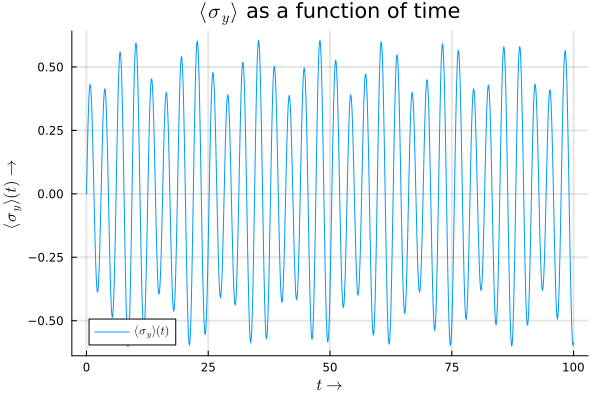

In [57]:
plot_expectation_values(red_exp_val_sigmay_ts_ss, time_span,"y")

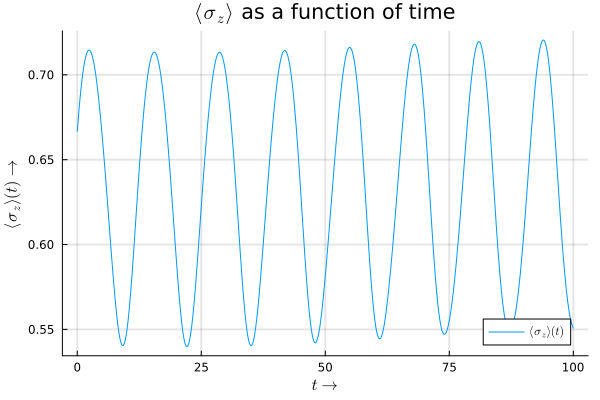

In [58]:
plot_expectation_values(red_exp_val_sigmaz_ts_ss, time_span,"z")

Plotting the total expectation "vector" as a function of time as done previously:

[ Info: Saved animation to c:\Users\Computing\Documents\PYL800 Julia\Varying Expectations (Reduced Single Spin).gif


Plots.AnimatedGif("c:\\Users\\Computing\\Documents\\PYL800 Julia\\Varying Expectations (Reduced Single Spin).gif")
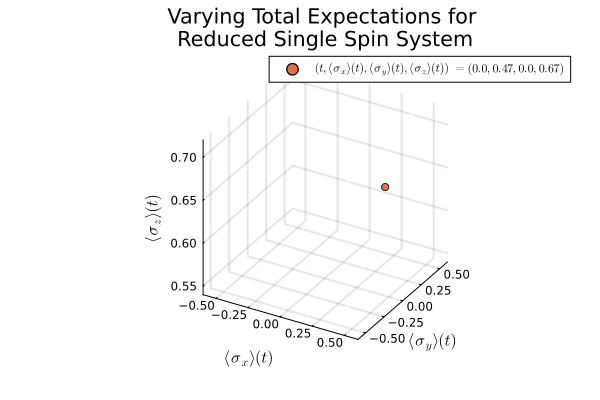

In [59]:
gr()
anim_new = @animate for i ∈ 1:N_t
    curr_t,x,y,z = round.((time_span[i],red_exp_val_sigmax_ts_ss[i],red_exp_val_sigmay_ts_ss[i],red_exp_val_sigmaz_ts_ss[i]),digits=2)
    plot(red_exp_val_sigmax_ts_ss[1:i], red_exp_val_sigmay_ts_ss[1:i], red_exp_val_sigmaz_ts_ss[1:i], zlims=(minimum(red_exp_val_sigmaz_ts_ss),maximum(red_exp_val_sigmaz_ts_ss)), ylims=(minimum(red_exp_val_sigmay_ts_ss),maximum(red_exp_val_sigmay_ts_ss)), xlims=(minimum(red_exp_val_sigmax_ts_ss),maximum(red_exp_val_sigmax_ts_ss)), label="", title="Varying Total Expectations for \nReduced Single Spin System", gridlinewidth=2);
    scatter!((red_exp_val_sigmax_ts_ss[i], red_exp_val_sigmay_ts_ss[i], red_exp_val_sigmaz_ts_ss[i]), label=L"(t,\langle \sigma_{x}\rangle (t),\langle \sigma_{y}\rangle (t),\langle \sigma_{z}\rangle (t))~="*latexstring("($curr_t,$x,$y,$z)"), xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)", legend=:topright);
end
gif(anim_new, string("Varying Expectations (Reduced Single Spin).gif"), fps = 10)

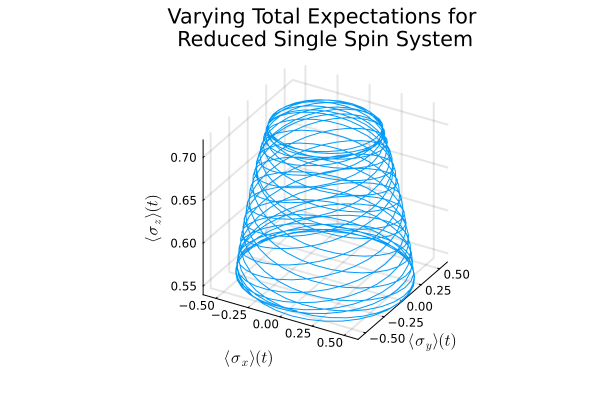

In [60]:
plot(red_exp_val_sigmax_ts_ss, red_exp_val_sigmay_ts_ss, red_exp_val_sigmaz_ts_ss, zlims=(minimum(red_exp_val_sigmaz_ts_ss),maximum(red_exp_val_sigmaz_ts_ss)), ylims=(minimum(red_exp_val_sigmay_ts_ss),maximum(red_exp_val_sigmay_ts_ss)), xlims=(minimum(red_exp_val_sigmax_ts_ss),maximum(red_exp_val_sigmax_ts_ss)), label="", title="Varying Total Expectations for \nReduced Single Spin System", xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)",gridlinewidth=2)

A Scatter plot of the same:

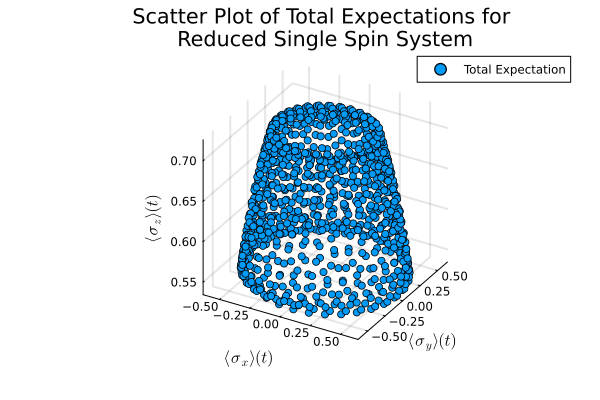

In [61]:
scatter(red_exp_val_sigmax_ts_ss,red_exp_val_sigmay_ts_ss,red_exp_val_sigmaz_ts_ss, label="Total Expectation", title="Scatter Plot of Total Expectations for \nReduced Single Spin System", xlabel=L"\langle σ_{x}\rangle (t)", ylabel=L"\langle σ_{y}\rangle (t)", zlabel=L"\langle σ_{z}\rangle (t)", gridlinewidth=2)

Finally, we calculate the Entropy!

In [62]:
# Calculating Entropy using 'Trace' definition
function entropy_ts(c)
    m1 = abs2(c[1]) + abs2(c[2])
    m3 = abs2(c[3]) + abs2(c[4])
    m2 = c[1]*conj(c[3]) + c[2]*conj(c[4])
    red_den_mat = [[m1, conj(m2)] [m2, m3]]

    return real(-tr(red_den_mat*log(red_den_mat)))
end

entropy_ts (generic function with 1 method)

In [63]:
entropy_vals_ts = [entropy_ts(solution_ts[1:4,i]) for i in 1:N_t]; # Entropy Values

Plotting the variation of Entropy of Entanglement with time:

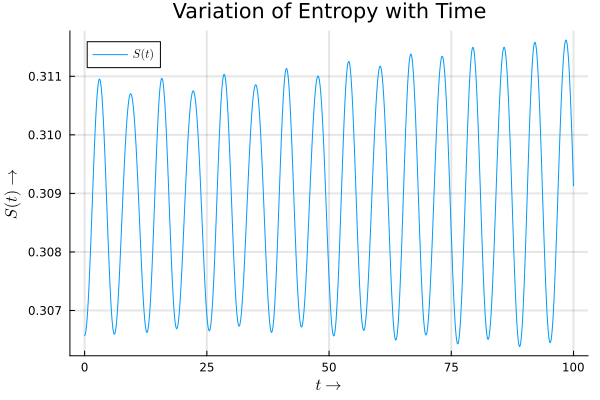

In [64]:
plot_entropy(entropy_vals_ts, time_span)

With this, we conclude the Project 3!